# Let's import a bunch of stuff

In [1]:
import sys
import seaborn as sb
import scanpy.api as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import argparse
import gc
##import scvelo as scv
%matplotlib inline

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

##logging.basicConfig(filename="CLUESImmVar_processed.V4.1.log", level=logging.ERROR)
sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"
##%matplotlib inline

In [3]:
version = "V6"

figdir = "./figures."+version+"/"
sc.settings.figdir = figdir

In [4]:
savepath = '/Users/yimmieg/Downloads/CLUESImmvarLymph.'+version+".annotated.h5ad"

In [5]:
adata = sc.read("CLUESImmvarLymph."+version+".h5ad", cache=False)
adata.shape

(527289, 1521)

In [6]:
adata.obs['disease_pop_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

In [7]:
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("immvar")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("immvar")] = "UCSF"

adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

# Let's first cluster with slightly lower resolution

## Also plot some differentially expressed genes

## And of course UMAP with the louvain clusters highlighted

## do an initial round of louvain to identify doublets and remove

In [8]:
sc.tl.louvain(adata, random_state=30)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:08:50.25)


ranking genes
    finished (0:05:19.18)


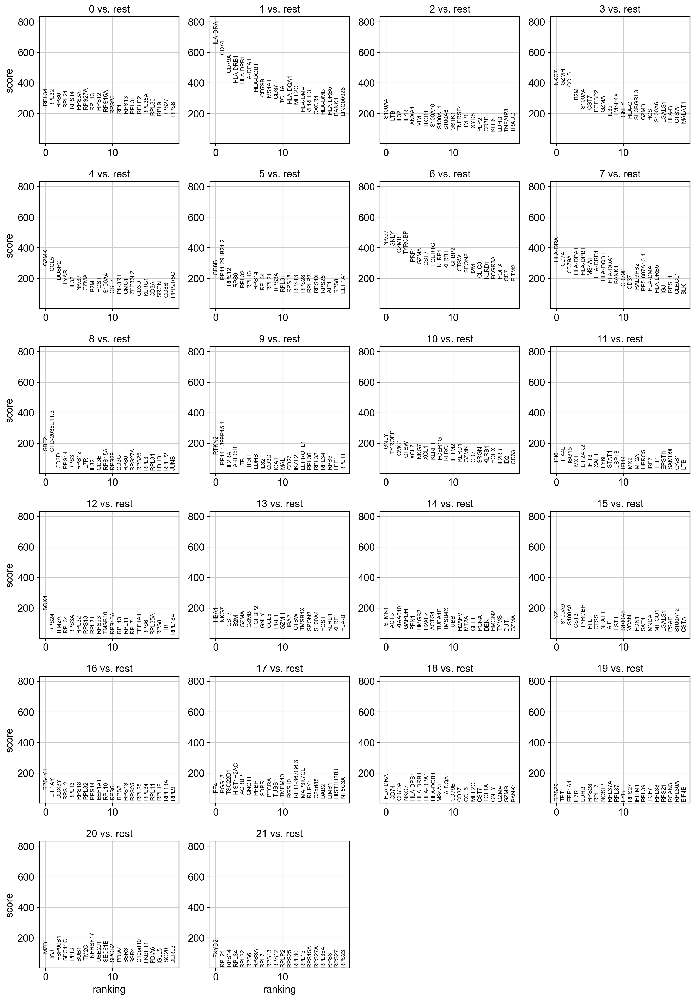

In [9]:
# #get visualization of all markers and their scores
sc.tl.rank_genes_groups(adata, groupby='louvain')
sc.pl.rank_genes_groups(adata)

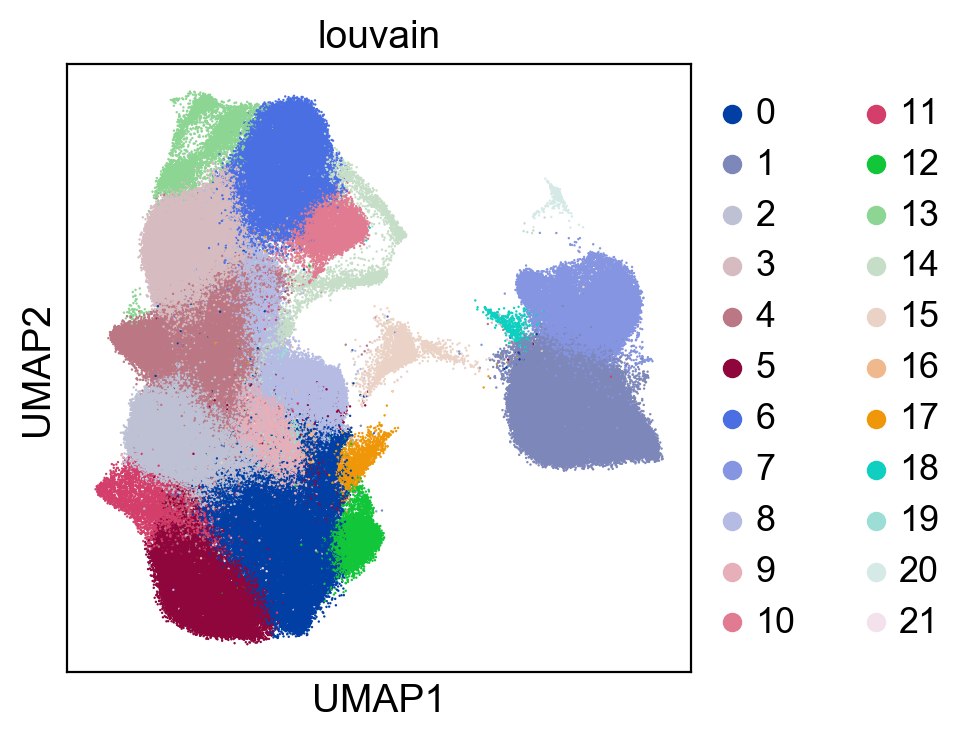

In [10]:
#plot UMAP of cell types colored by clusters
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='louvain', size = 3)

In [11]:
adata = adata[~adata.obs.louvain.isin(["15"])]

In [12]:
# #######################
# # Louvain and friends #
# #######################
# # Set parameters
# intialization = 1
# n_components = 20
# # Run louvain clustering on theoretical future gene expression per cell
# sc.pp.pca(adata, random_state=intialization, svd_solver='arpack')
# sc.pp.neighbors(adata, random_state=intialization)
# sc.tl.umap(adata, random_state=intialization)

In [13]:
# sc.tl.louvain(adata, random_state=30)
# # #get visualization of all markers and their scores
# sc.tl.rank_genes_groups(adata, groupby='louvain')
# sc.pl.rank_genes_groups(adata)
# #plot UMAP of cell types colored by clusters

In [14]:
# #plot UMAP of cell types colored by clusters
# adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
# sc.pl.umap(adata, color='louvain', size = 3)

In [15]:
# sc.tl.leiden(adata, random_state=30)

In [16]:
# # #get visualization of all markers and their scores
# sc.tl.rank_genes_groups(adata, groupby='leiden')
# sc.pl.rank_genes_groups(adata)

In [17]:
# #plot UMAP of cell types colored by clusters
# adata.uns['leiden_colors'] = sc.pl.palettes.vega_20_scanpy;
# sc.pl.umap(adata, color='leiden', size = 3)
# sc.pl.umap(adata, color='leiden', size=2, edgecolor="none", save=".leiden.png")

In [18]:
sc.tl.leiden(adata, random_state=30,resolution=1.3)

running Leiden clustering
    finished (0:58:59.93)


ranking genes
    finished (0:05:22.07)


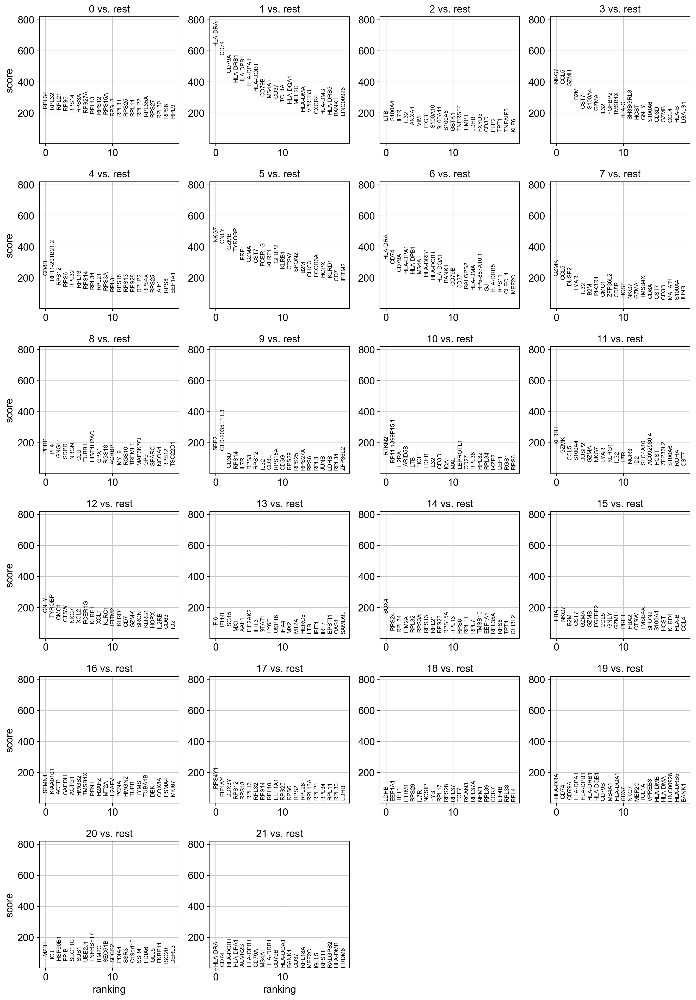

In [19]:
# #get visualization of all markers and their scores
sc.tl.rank_genes_groups(adata, groupby='leiden')
sc.pl.rank_genes_groups(adata)

saving figure to file ./figures.V6/umap.leiden.png


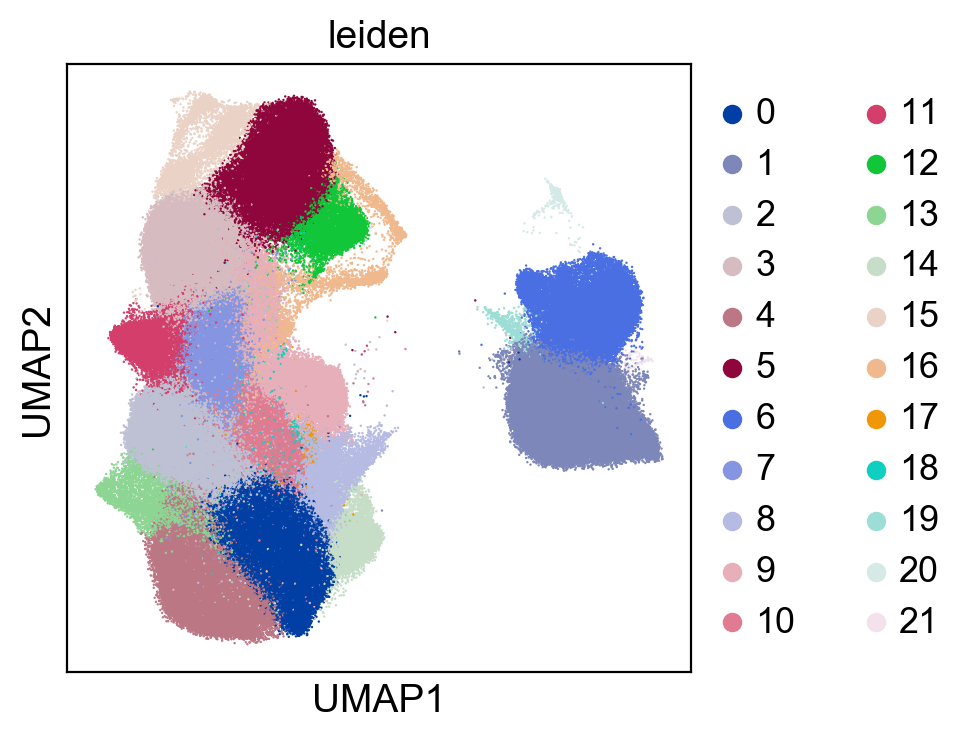

In [20]:
#plot UMAP of cell types colored by clusters
adata.uns['leiden_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden', size = 3)
sc.pl.umap(adata, color='leiden', size=2, edgecolor="none", save=".leiden.png")

saving figure to file ./figures.V6/umap.disease.png


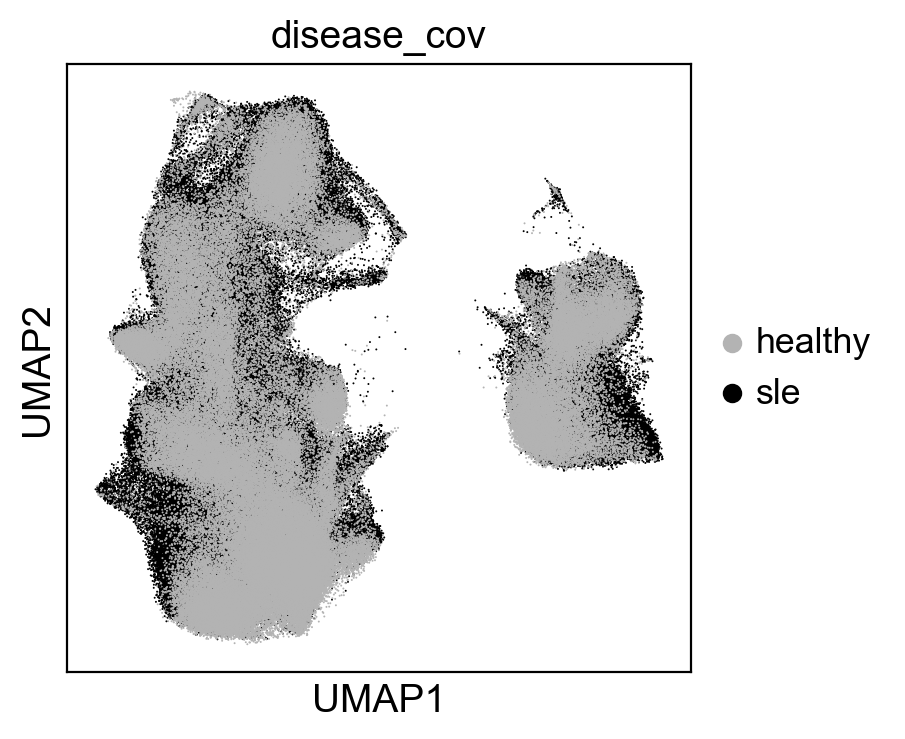

In [21]:
sc.pl.umap(adata, color='disease_cov', size=2, edgecolor="none", palette=['#B3B3B3','#000000'])
sc.pl.umap(adata, color='disease_cov', size=2, edgecolor="none", palette=['#B3B3B3','#000000'], save=".disease.png")

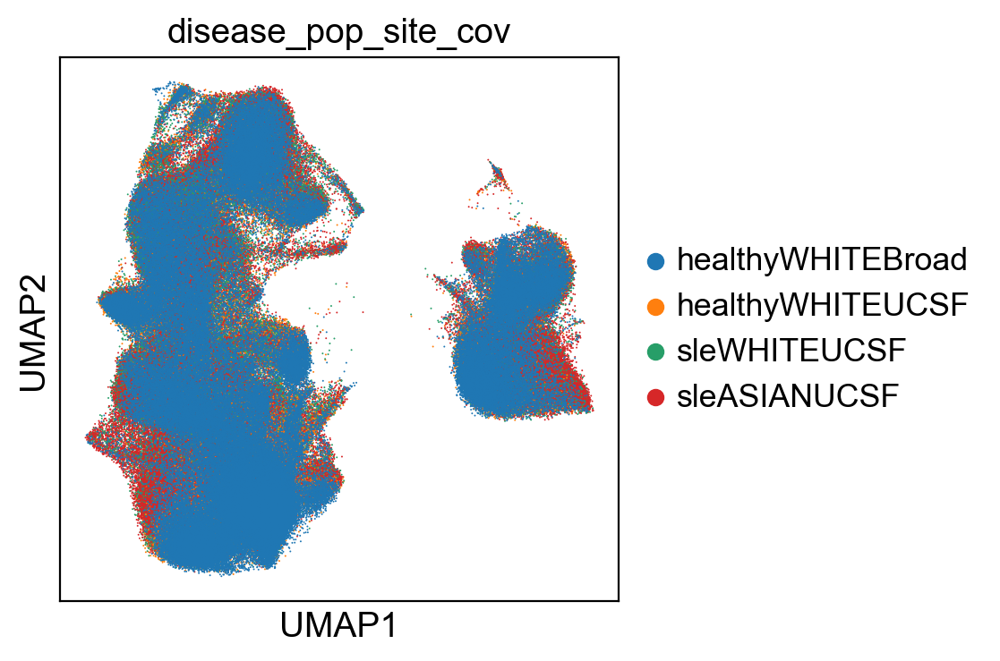

In [22]:
adata.uns['disease_pop_site_cov_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='disease_pop_site_cov', size=2, edgecolor="none")

# Now let's plot differences in cluster proportion for ALL samples including UCSF and Broad ImmVar

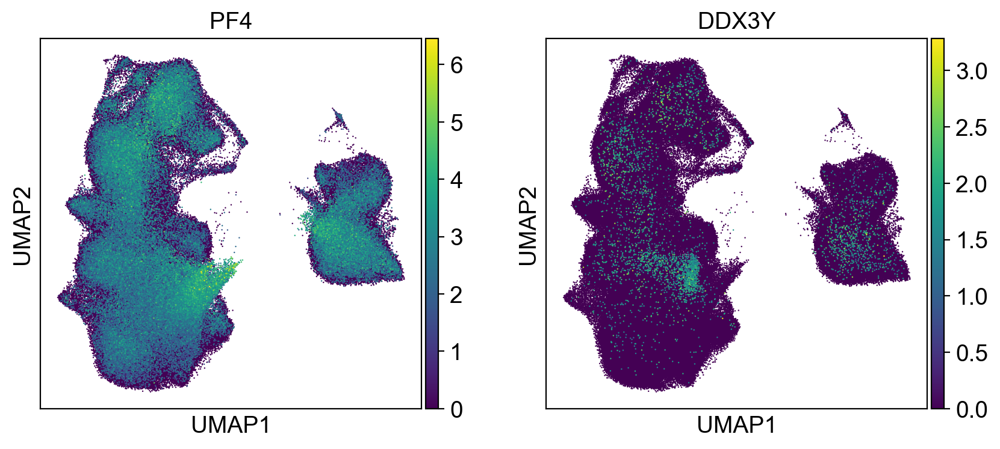

In [23]:
sc.pl.umap(adata, color=['PF4', 'DDX3Y'], palette="Greys", size=3, ncols=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

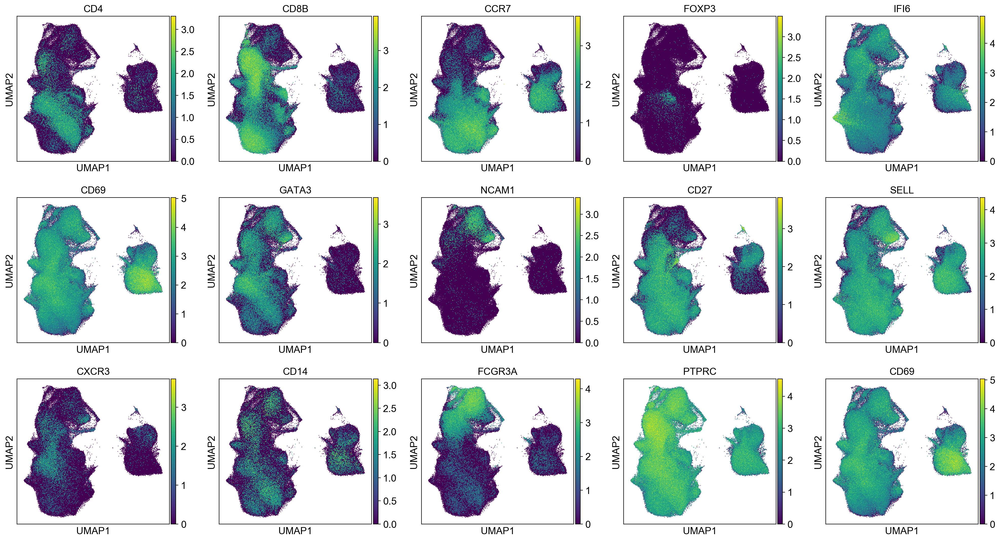

In [111]:
sc.pl.umap(adata, color=['CD4', 'CD8B','CCR7', "FOXP3","IFI6","CD69","GATA3",'NCAM1','CD27', 'SELL', 'CXCR3', 'CD14', 'FCGR3A', 'PTPRC', 'CD69'], palette="Greys", size=3, ncols=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

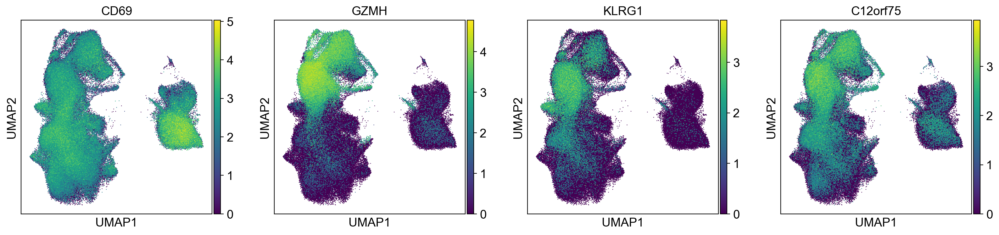

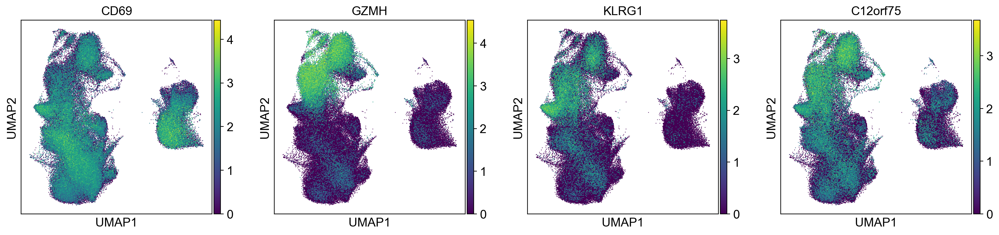

In [114]:
sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD69','GZMH','KLRG1','C12orf75'], palette="Greys", size=3, ncols=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD69','GZMH','KLRG1','C12orf75'], palette="Greys", size=3, ncols=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

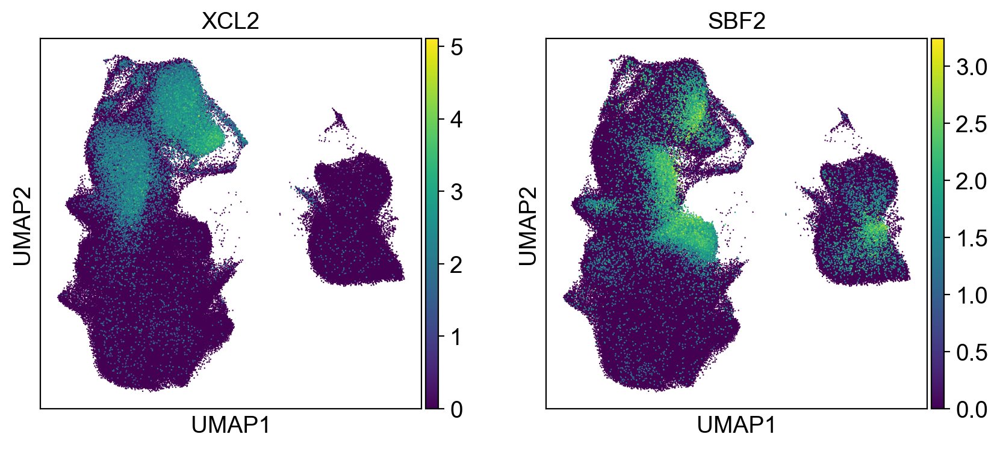

In [124]:
sc.pl.umap(adata, color=['XCL2','SBF2'], palette="Greys", size=3, ncols=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)


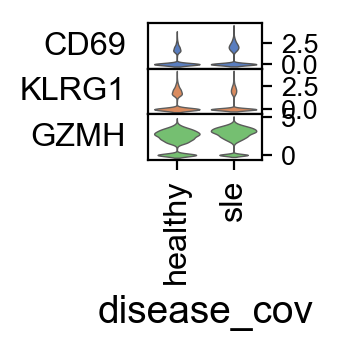

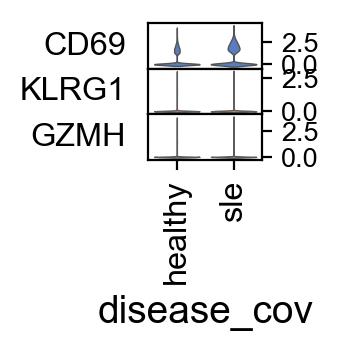

In [123]:
sc.pl.stacked_violin(adata[adata.obs.ct_cov=="T8em cyto1"], var_names=['CD69','KLRG1', 'GZMH'], groupby="disease_cov", swap_axes=True, standard_scale="var")
sc.pl.stacked_violin(adata[adata.obs.ct_cov=="T4naive"], var_names=['CD69','KLRG1', 'GZMH'], groupby="disease_cov", swap_axes=True, standard_scale="var")


## plot based on best guess of lineage

In [26]:
# #plot UMAP of cell types colored by clusters
# adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
# sc.pl.umap(adata, color='louvain', size = 3)

In [27]:
# pd.set_option('display.max_columns', None)
# unique_leiden = np.unique(adata.obs['louvain'].values)
# # Compile list of top genes
# GeneRanks = pd.DataFrame()
# for ii in range(len(unique_leiden)):
#     GeneRanks[str('louvain_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['louvain'] == str(ii)], axis=0)))]
# ##GeneRanks.to_csv('FLARE_top_expression.csv')
# GeneRanks.head(20)

In [28]:
# adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')
# ## do some manual cell type assignment
# adata.obs.loc[adata.obs.louvain == "0","ct_cov"] = "T4 naive" # CCR7, SOCS3-, TNF- CREM-
# adata.obs.loc[adata.obs.louvain == "1","ct_cov"] = "Th"# CCR7-, GATA3, RORA, CD45+, IL7R, CREM+
# adata.obs.loc[adata.obs.louvain == "2","ct_cov"] = "Naive B" # PRF1, CD8+, IL7R-
# adata.obs.loc[adata.obs.louvain == "3","ct_cov"] = "Memory CD4+" # CD69+, CCR7+, SOCS3+ CREM+
# adata.obs.loc[adata.obs.louvain == "4","ct_cov"] = "Naive CD8+" # CCR7+, CD8+
# adata.obs.loc[adata.obs.louvain == "5","ct_cov"] = "Memory CD8+"# CREM+ CD8+, IL7R+
# adata.obs.loc[adata.obs.louvain == "6","ct_cov"] = "Naive CD4+" # CCR7+, FOXP1+
# adata.obs.loc[adata.obs.louvain == "7","ct_cov"] = "Memory B"# PRF1+, CD8-, IL7+, CREM-, 
# adata.obs.loc[adata.obs.louvain == "8","ct_cov"] = "Naive CD4+" # CCR7+ CD8-, S100A4- 
# adata.obs.loc[adata.obs.louvain == "9","ct_cov"] = "T Reg" # IL2RA+, CTLA4+, FOXP3+
# adata.obs.loc[adata.obs.louvain == "10","ct_cov"] = "Progenitor" # IFN+, STAT1+
# adata.obs.loc[adata.obs.louvain == "11","ct_cov"] = "Platelet" # Platelet markers
# adata.obs.loc[adata.obs.louvain == "12","ct_cov"] = "Activated Th" # STMN1+ SOX4+
# adata.obs.loc[adata.obs.louvain == "13","ct_cov"] = "ProlifT" # PTCRA+
# adata.obs.loc[adata.obs.louvain == "14","ct_cov"] = "Myeloid" # MNDA, CD14, FCER1G
# adata.obs.loc[adata.obs.louvain == "15","ct_cov"] = "Cycling CD8+" # TYMS STMN1
# adata.obs.loc[adata.obs.louvain == "16","ct_cov"] = "B" #CD79A
# adata.obs.loc[adata.obs.louvain == "17","ct_cov"] = "Plasmablasts" #CD79A
# adata.obs.loc[adata.obs.louvain == "18","ct_cov"] = "Myeloid" # MNDA, CD14, FCER1G
# adata.obs.loc[adata.obs.louvain == "19","ct_cov"] = "Cycling CD8+" # TYMS STMN1
# adata.obs.loc[adata.obs.louvain == "20","ct_cov"] = "B" #CD79A
# adata.obs.loc[adata.obs.louvain == "21","ct_cov"] = "Plasmablasts" #CD79A


# adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

In [29]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
##GeneRanks.to_csv('FLARE_top_expression.csv')
GeneRanks.head(20)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21
0,TSHZ2,CD79A,S100A4,GZMH,RP11-291B21.2,GZMB,RP5-887A10.1,GZMK,PPBP,SBF2,RTKN2,SLC4A10,XCL1,IFIT3,SOX4,HBA1,KIAA0101,EIF1AY,ACVR2B,HLA-DRA,TNFRSF17,ACVR2B
1,LTB,HLA-DRA,TNFRSF4,CCL5,CD8B,KLRF1,MS4A1,DUSP2,CLU,CTD-2035E11.3,RP11-1399P15.1,KLRB1,XCL2,IFI44L,CHI3L2,HBA2,TYMS,RPS4Y1,PRDM6,CD79A,MZB1,PRDM6
2,AIF1,TCL1A,ITGB1,NKG7,S100B,PRF1,HLA-DRA,CCL5,MYL9,IL32,IL2RA,GZMK,KLRC1,IFI6,ITM2A,FGFBP2,MKI67,DDX3Y,GABRE,CD74,IGJ,MS4A1
3,FAM13A,CD74,LTB,CST7,CD8A,SPON2,CD79A,LYAR,NRGN,CD8B,ICA1,KLRG1,CMC1,ISG15,AIF1,GZMB,STMN1,PRDM6,HBB,HLA-DQB1,DERL3,HLA-DQB1
4,EPHB6,CD79B,ANXA1,FGFBP2,AIF1,GNLY,BANK1,PIK3R1,TREML1,ZFP36L2,TIGIT,NCR3,GNLY,IFIT1,MIR181A1HG,NKG7,TK1,DONSON,DONSON,TCL1A,HRASLS2,HLA-DRA
5,TMIGD2,HLA-DQB1,IL32,GZMA,PASK,TYROBP,AL928768.3,CD8B,GP9,JUN,ARID5B,DUSP2,SPTSSB,MX1,LTB,PRF1,NUSAP1,TTTY15,IFI27,HLA-DPA1,ITM2C,BANK1
6,AC013264.2,HLA-DRB1,RP11-403A21.2,S100A4,CRTAM,FCER1G,CLECL1,CMC1,LTB,CD8A,IKZF2,LYAR,KLRF1,USP18,EPHB6,CST7,PCNA,UTY,PPBP,HLA-DPB1,AL928768.3,CD79A
7,HSPB1,MEF2C,S100A11,IL32,SPINK2,CLIC3,CD74,IL32,AIF1,TNFAIP3,DUSP4,AC092580.4,TYROBP,RSAD2,TMIGD2,SPON2,CLSPN,GABRE,PF4,HLA-DRB1,IGLL5,CD79B
8,SCGB3A1,MS4A1,TIMP1,CCL4,PRDM6,FGFBP2,HLA-DPA1,CD8A,PF4,HCST,FOXP3,CCL5,IL2RB,EIF2AK2,STMN1,GNLY,BIRC5,ACVR2B,CCL5,NKG7,CD38,HLA-DPA1
9,ITM2A,HLA-DPA1,GATA3,GNLY,DONSON,FCGR3A,HLA-DQA1,ZFP36L2,CD7,RP5-1073O3.7,IL32,GZMA,NCAM1,HERC5,HSPB1,GZMA,CENPF,LTB,NKG7,MS4A1,POU2AF1,CD74


In [85]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('str')

## do some manual cell type assignment
adata.obs.loc[adata.obs.leiden == "0","ct_cov"] = "T4naive" # 
adata.obs.loc[adata.obs.leiden == "1","ct_cov"] = "Bnaive" # TCL1A downregulated in memory B
adata.obs.loc[adata.obs.leiden == "2","ct_cov"] = "T4cm" # CXCR3 positive
adata.obs.loc[adata.obs.leiden == "3","ct_cov"] = "T8em cyto1" # CXCR3+, CCR7-, GZMH+
adata.obs.loc[adata.obs.leiden == "4","ct_cov"] = "T8naive" # 
adata.obs.loc[adata.obs.leiden == "5","ct_cov"] = "NK1"# 
adata.obs.loc[adata.obs.leiden == "6","ct_cov"] = "Bmem" # CXCR3
adata.obs.loc[adata.obs.leiden == "7","ct_cov"] = "T8em cyto2"# CXCR3+, CCR7+, GZMK+
adata.obs.loc[adata.obs.leiden == "8","ct_cov"] = "MKcontam" # 
adata.obs.loc[adata.obs.leiden == "9","ct_cov"] = "T8cm" # 
adata.obs.loc[adata.obs.leiden == "10","ct_cov"] = "T4reg" # CD27 late stage, CXCR3-, CCR7+, CD62L
adata.obs.loc[adata.obs.leiden == "11","ct_cov"] = "T8em cyto3" # CXCR3-, CCR7-, KLRB1+
adata.obs.loc[adata.obs.leiden == "12","ct_cov"] = "NK2" # 
adata.obs.loc[adata.obs.leiden == "13","ct_cov"] = "T4IFN" # 
adata.obs.loc[adata.obs.leiden == "14","ct_cov"] = "Progenitor" # 
adata.obs.loc[adata.obs.leiden == "15","ct_cov"] = "NK3" # 
adata.obs.loc[adata.obs.leiden == "16","ct_cov"] = "TProlif" #
adata.obs.loc[adata.obs.leiden == "17","ct_cov"] = "T4naive" #
adata.obs.loc[adata.obs.leiden == "18","ct_cov"] = "T8cm" # CD27 late stage, CXCR3-, CCR7+, CD62L
adata.obs.loc[adata.obs.leiden == "19","ct_cov"] = "Batypical" #
adata.obs.loc[adata.obs.leiden == "20","ct_cov"] = "Bplasma" #
adata.obs.loc[adata.obs.leiden == "21","ct_cov"] = "Bmem" #

adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

saving figure to file ./figures.V6/umap.ct_cov.png


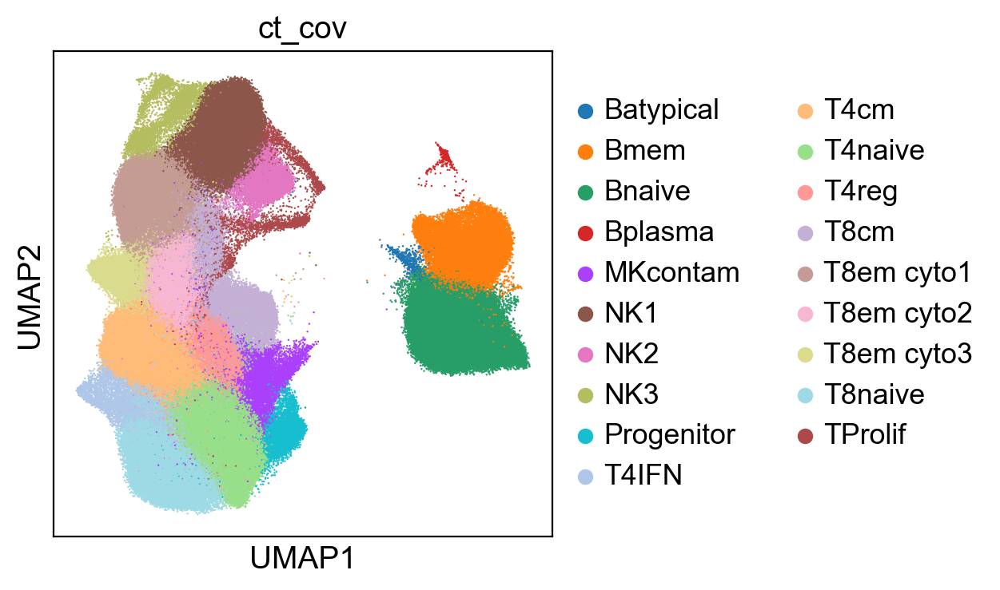

In [86]:
#plot UMAP of cell types colored by clusters
sc.pl.palettes.vega_20_scanpy;
adata.uns['ct_cov_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='ct_cov', size = 3)
sc.pl.umap(adata, color='ct_cov', size=2, edgecolor="none", save=".ct_cov.png")

In [32]:
adata.write(savepath, compression="gzip")